In [35]:
import matplotlib.pyplot as plt
import anndata as adata
import scanpy as sc
from wmb import cemba, mm10
from ALLCools.mcds import MCDS
from ALLCools.clustering import significant_pc_test
from ALLCools.plot import *
import pandas as pd
from harmonypy import run_harmony

In [36]:
import os
default_n_threads = 8
os.environ['OPENBLAS_NUM_THREADS'] = f"{default_n_threads}"
os.environ['MKL_NUM_THREADS'] = f"{default_n_threads}"
os.environ['OMP_NUM_THREADS'] = f"{default_n_threads}"

In [37]:
!export OPENBLAS_NUM_THREADS=8
!export MKL_NUM_THREADS=8
!export OMP_NUM_THREADS=8

In [38]:
adata_sc = adata.read_h5ad("/data2st1/junyi/output/sc_canghao/6_combined_normalized_anndata_with_celltype.L1.h5ad")

In [39]:
adata_sc.var.columns

Index(['gene_ids', 'feature_types', 'genome', 'mt'], dtype='object')

In [40]:
adata_sc.obs.columns

Index(['batch', 'sex', 'treatment', 'mouseID', 'region', 'tech', 'batch_name',
       'doublet_score', 'predicted_doublet', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes',
       'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'Louvain_clusters_res1.0', 'Leiden_clusters_res1.0', 'celltype.L1'],
      dtype='object')

In [41]:
cluster_22_cells = adata_sc.obs_names[adata_sc.obs['Leiden_clusters_res1.0'] == '22']
adata_sc.obs.loc[cluster_22_cells, 'celltype.L1'] = 'Neuron'


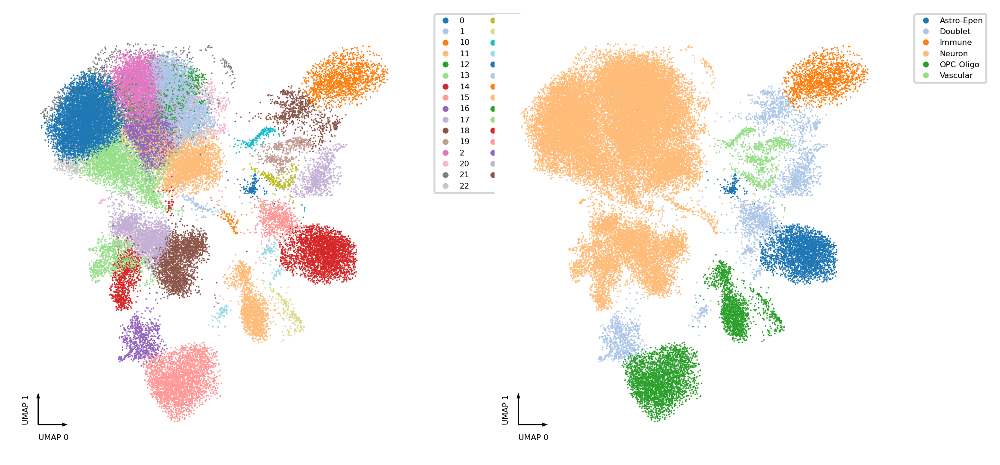

In [42]:
fig, axes = plt.subplots(figsize=(8, 4), dpi=300, ncols=2)
ax = axes[0]
categorical_scatter(ax=ax, data=adata_sc, hue='Leiden_clusters_res1.0', palette='tab20',show_legend=True)
ax = axes[1]
categorical_scatter(ax=ax, data=adata_sc, hue='celltype.L1', palette='tab20',show_legend=True)


In [10]:
df_mc_meta=pd.read_csv('/data2st1/junyi/methlyatlas/mCseq/CEMBA.mC.Metadata/CEMBA.mC.Metadata.csv')

In [11]:
# PFC_AMY_subregions = ['MOs','PL.ORB','PL,ACA,ILA','CTXsp,sAMY']
# selected_cells = df_mc_meta[(df_mc_meta.SubRegion.isin(PFC_AMY_subregions)) | (df_mc_meta.MajorRegion.isin(["HPF"]))].index
# selected_meta = df_mc_meta.loc[selected_cells]

In [12]:
PFC_subregions = ['PL,ORB','PL,ACA,ILA']
selected_cells = df_mc_meta[(df_mc_meta.SubRegion.isin(PFC_subregions))].index
selected_meta = df_mc_meta.loc[selected_cells]

In [13]:
df_umap = pd.read_csv('/data2st1/junyi/methlyatlas/mCseq/CEMBA.mC.Coordinates/CEMBA.mC.Coordinates.csv.gz',index_col=0)

In [15]:
selected_meta

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,InputReads,PassBasicQC,PlateNormCov,CEMBARegion,MajorRegion,SubRegion,CellGroup,SubClass,Class,NeuroTransmitters
44786,2A_M_0,0.00650,0.81879,0.03230,1331460.0,PFC-1,CEMBA180122_2A_1,18,0,2,...,3047360,True,0.987732,2A,Isocortex,"PL,ORB",c3_c5_c2_c0_r0,L4/5 IT CTX Glut,IT-ET Glut,Glut
44787,2A_M_1,0.00549,0.80928,0.02411,1216036.0,PFC-1,CEMBA180122_2A_1,18,1,2,...,2831092,True,0.902106,2A,Isocortex,"PL,ORB",c3_c0_c4_c0_r1,L6 IT CTX Glut,IT-ET Glut,Glut
44788,2A_M_10,0.00523,0.78627,0.02228,1948720.0,PFC-1,CEMBA180122_2A_1,21,0,2,...,4530404,True,1.445641,2A,Isocortex,"PL,ORB",c3_c7_c1_c2_r0,L6 IT CTX Glut,IT-ET Glut,Glut
44789,2A_M_100,0.00530,0.80248,0.02132,1008760.0,PFC-1,CEMBA180122_2A_2,20,3,2,...,2544422,True,0.979836,2A,Isocortex,"PL,ORB",c3_c0_c2_c0_r3,L6 IT CTX Glut,IT-ET Glut,Glut
44790,2A_M_1000,0.00485,0.78678,0.01940,1439894.0,PFC-1,CEMBA180122_2A_3,1,10,2,...,3135396,True,1.414192,2A,Isocortex,"PL,ORB",c1_c0_c2_c0_r4,L2/3 IT CTX Glut,IT-ET Glut,Glut
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59439,3A_M_995,0.00672,0.80778,0.02777,1295224.0,PFC-2,CEMBA180129_3A_3,7,6,3,...,3111498,True,0.737020,3A,Isocortex,"PL,ACA,ILA",c14_c8_c0_c1_r0,L5 ET CTX Glut,IT-ET Glut,Glut
59440,3A_M_996,0.00765,0.82116,0.03245,882961.0,PFC-2,CEMBA180129_3A_3,7,7,3,...,2333106,True,0.502431,3A,Isocortex,"PL,ACA,ILA",c14_c1_c0_c0_r1,L5 ET CTX Glut,IT-ET Glut,Glut
59441,3A_M_997,0.00728,0.82811,0.03355,1338070.0,PFC-2,CEMBA180129_3A_4,6,6,3,...,3218432,True,0.843445,3A,Isocortex,"PL,ACA,ILA",c2_c4_c0_c2_r1,L6 CT CTX Glut,NP-CT-L6b Glut,Glut
59442,3A_M_998,0.00741,0.82871,0.03281,1189174.0,PFC-2,CEMBA180129_3A_4,6,7,3,...,2942562,True,0.749589,3A,Isocortex,"PL,ACA,ILA",c2_c4_c0_c1_r2,L6 CT CTX Glut,NP-CT-L6b Glut,Glut


In [16]:
if selected_meta.shape[0]>20000:
    sampled_df = selected_meta.sample(n=20000, random_state=42)  # Setting a random state for reproducibility
    selected_df_meta = sampled_df.merge(df_umap,left_on="cell",right_index=True)
else:
    selected_df_meta = selected_meta.merge(df_umap,left_on="cell",right_index=True)

In [17]:
selected_df_meta

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,Class,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1
44786,2A_M_0,0.00650,0.81879,0.03230,1331460.0,PFC-1,CEMBA180122_2A_1,18,0,2,...,IT-ET Glut,Glut,47.737453,2.057758,15.355251,5.155235,-41.359146,13.296869,-41.359146,13.296869
44787,2A_M_1,0.00549,0.80928,0.02411,1216036.0,PFC-1,CEMBA180122_2A_1,18,1,2,...,IT-ET Glut,Glut,41.164764,13.121942,13.217875,6.767199,-51.482307,23.431246,-51.482307,23.431246
44788,2A_M_10,0.00523,0.78627,0.02228,1948720.0,PFC-1,CEMBA180122_2A_1,21,0,2,...,IT-ET Glut,Glut,48.292343,14.948050,13.882070,8.168542,-46.897380,54.917377,-46.897380,54.917377
44789,2A_M_100,0.00530,0.80248,0.02132,1008760.0,PFC-1,CEMBA180122_2A_2,20,3,2,...,IT-ET Glut,Glut,40.970654,14.469663,12.606815,7.397454,-74.672000,45.316154,-74.672000,45.316154
44790,2A_M_1000,0.00485,0.78678,0.01940,1439894.0,PFC-1,CEMBA180122_2A_3,1,10,2,...,IT-ET Glut,Glut,32.056923,-18.227364,17.109333,-2.730826,19.637724,-30.621058,19.637724,-30.621058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59439,3A_M_995,0.00672,0.80778,0.02777,1295224.0,PFC-2,CEMBA180129_3A_3,7,6,3,...,IT-ET Glut,Glut,34.962692,32.897310,18.771175,8.472170,21.006292,6.723645,21.006292,6.723645
59440,3A_M_996,0.00765,0.82116,0.03245,882961.0,PFC-2,CEMBA180129_3A_3,7,7,3,...,IT-ET Glut,Glut,33.025913,34.344215,19.031935,8.012224,25.796904,15.279222,25.796904,15.279222
59441,3A_M_997,0.00728,0.82811,0.03355,1338070.0,PFC-2,CEMBA180129_3A_4,6,6,3,...,NP-CT-L6b Glut,Glut,16.913788,45.638023,13.386567,13.282033,8.854631,58.052270,8.854631,58.052270
59442,3A_M_998,0.00741,0.82871,0.03281,1189174.0,PFC-2,CEMBA180129_3A_4,6,7,3,...,NP-CT-L6b Glut,Glut,15.421233,45.794990,13.258053,13.400411,8.211007,60.819965,8.211007,60.819965


# Prepare L4 region level methlylation data and load the gene 2k flaking bases

In [18]:
var_dim = 'geneslop2k-vm23'
mcds = MCDS.open('/data2st1/junyi/methlyatlas/mCseq/data.nemoarchive.org/biccn/grant/u19_cemba/ecker/epigenome/cellgroup/mCseq3/mouse/processed/counts/CEMBA.snmC.mcds',
                   obs_dim='cell',var_dim=var_dim,use_obs=selected_df_meta.cell)

In [19]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, count_type: 2,
                               geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * count_type                (count_type) <U3 'mc' 'cov'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da        (cell, geneslop2k-vm23, mc_type, count_type) uint16 dask.array<chunksize=(1000, 32208, 1, 1), meta=np.ndarray>
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [22]:
gene_meta_path = 'wmb/files/modified_gencode.vM23.primary_assembly.annotation.gene.flat.tsv.gz'


In [23]:
gene_meta = pd.read_csv(gene_meta_path, index_col='gene_id', sep='\t')


In [24]:
gene_meta.head()

,chrom,source,feature,start,end,score,strand,phase,transcript_id,gene_type,...,transcript_type,transcript_status,transcript_name,exon_number,exon_id,level,gene_version,mgi_id,havana_gene,tag
gene_id,,,,,,,,,,,,,,,,,,,,,
ENSMUSG00000051951,chr1,HAVANA,gene,3205901,3671498,.,-,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,2,5,MGI:3528744,OTTMUSG00000026353.2,NaN
ENSMUSG00000089699,chr1,HAVANA,gene,3466587,3513553,.,+,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:3780162,OTTMUSG00000026352.1,NaN
ENSMUSG00000102331,chr1,HAVANA,gene,3647309,3658904,.,-,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:5012123,OTTMUSG00000049924.1,NaN
ENSMUSG00000102343,chr1,HAVANA,gene,3905739,3986215,.,-,.,NaN,lncRNA,...,NaN,NaN,NaN,NaN,NaN,2,1,MGI:5610609,OTTMUSG00000049934.1,NaN
ENSMUSG00000025900,chr1,HAVANA,gene,3999557,4409241,.,-,.,NaN,protein_coding,...,NaN,NaN,NaN,NaN,NaN,2,12,MGI:1341105,OTTMUSG00000049985.3,overlapping_locus


In [25]:
import pybedtools

genes_to_skip = set()
chrom_to_remove = ['chrM']


# skip smaller genes mostly covered by a larger gene, e.g., a miRNA within a protein coding gene.
# F=0.9 means > 90% of gene_b is overlapped with gene_a, in this case, we only keep gene_a for DMG test
gene_bed = pybedtools.BedTool.from_dataframe(
    gene_meta.reset_index()[['chrom', 'start', 'end', 'gene_id']])
mapped_bam = gene_bed.map(b=gene_bed, c=4, o='distinct', F=0.9)
for _, (*_, gene_a, gene_b_str) in mapped_bam.to_dataframe().iterrows():
    for gene_b in gene_b_str.split(','):
        if gene_b != gene_a:
            genes_to_skip.add(gene_b)

# remove certain chromosomes
genes_to_skip |= set(gene_meta.index[gene_meta['chrom'].isin(chrom_to_remove)])
use_features = gene_meta.index[~gene_meta.index.isin(genes_to_skip)]
print(f'{use_features.size} features remained')


***** WARNING: File /tmp/pybedtools.clbesxyv.tmp has inconsistent naming convention for record:
GL456210.1	9124	58882	ENSMUSG00000079800

***** WARNING: File /tmp/pybedtools.clbesxyv.tmp has inconsistent naming convention for record:
GL456210.1	9124	58882	ENSMUSG00000079800



28457 features remained


Using existing geneslop2k-vm23_cov_mean in MCDS.coords, if this is not desired, delete the existing results by `del mcds.coords["geneslop2k-vm23_cov_mean"]` and recalculate.
27651 features remained


/tmp/ipykernel_1549441/370854858.py:5: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead.
  use_features &= feature_cov_mean[feature_cov_mean > min_cov].index


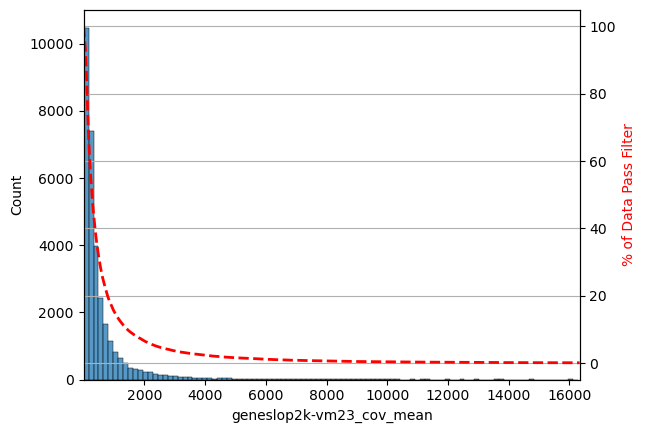

In [26]:
min_cov = 5
mcds.add_feature_cov_mean()

feature_cov_mean = mcds.coords[f'{var_dim}_cov_mean'].to_pandas()
use_features &= feature_cov_mean[feature_cov_mean > min_cov].index

print(f'{use_features.size} features remained')


In [27]:
use_features

Index(['ENSMUSG00000051951', 'ENSMUSG00000102343', 'ENSMUSG00000025900',
       'ENSMUSG00000025902', 'ENSMUSG00000104238', 'ENSMUSG00000104328',
       'ENSMUSG00000033845', 'ENSMUSG00000025903', 'ENSMUSG00000033813',
       'ENSMUSG00000002459',
       ...
       'ENSMUSG00000101533', 'ENSMUSG00000102045', 'ENSMUSG00000100492',
       'ENSMUSG00000099982', 'ENSMUSG00000101402', 'ENSMUSG00000100574',
       'ENSMUSG00000100608', 'ENSMUSG00000102011', 'ENSMUSG00000096178',
       'ENSMUSG00000096768'],
      dtype='object', length=27651)

In [28]:
mcds.filter_feature_by_cov_mean(min_cov=min_cov)


Before cov mean filter: 32208 geneslop2k-vm23
 After cov mean filter: 31425 geneslop2k-vm23 97.6%


<xarray.MCDS>
Dimensions:                   (cell: 5111, count_type: 2,
                               geneslop2k-vm23: 31425, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * count_type                (count_type) <U3 'mc' 'cov'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da        (cell, geneslop2k-vm23, mc_type, count_type) uint16 dask.array<chunksize=(1000, 31425, 1, 1), meta=np.ndarray>
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 31425, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [29]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, count_type: 2,
                               geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * count_type                (count_type) <U3 'mc' 'cov'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da        (cell, geneslop2k-vm23, mc_type, count_type) uint16 dask.array<chunksize=(1000, 32208, 1, 1), meta=np.ndarray>
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [30]:
mcds.add_mc_frac(normalize_per_cell=True, clip_norm_value=10)


In [31]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, count_type: 2,
                               geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * count_type                (count_type) <U3 'mc' 'cov'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da        (cell, geneslop2k-vm23, mc_type, count_type) uint16 dask.array<chunksize=(1000, 32208, 1, 1), meta=np.ndarray>
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float64 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [32]:
mcds = mcds[['geneslop2k-vm23_da_frac']]
mcds['geneslop2k-vm23_da_frac'] = mcds['geneslop2k-vm23_da_frac'].astype('float32')


In [33]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [34]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [35]:
mcds.write_dataset('output/geneslop2k-vm23_frac.mcds', var_dims=['geneslop2k-vm23'],mode='w')


Saving geneslop2k-vm23
Saving chunk 0: 0 - 1000


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Saving chunk 1: 1000 - 2000


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Saving chunk 2: 2000 - 3000


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Saving chunk 3: 3000 - 4000


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Saving chunk 4: 4000 - 5000


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


Saving chunk 5: 5000 - 5111


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [36]:
use_gene_meta = gene_meta.loc[use_features]
use_gene_meta.to_csv('output/GeneMetadata.csv.gz')


In [37]:

mcg = mcds.get_adata(mc_type='CGN',var_dim='geneslop2k-vm23',obs_dim='cell')

select_hvf is True, but no highly variable feature results found, use all features instead.


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [38]:
mcg


AnnData object with n_obs × n_vars = 5111 × 32208
    var: 'chrom', 'cov_mean', 'end', 'start'

In [39]:
mcg.obs

""
cell
3A_M_2344
3A_M_2548
3A_M_344
2A_M_1788
2A_M_2460
...
2A_M_1628
3A_M_2218
3A_M_2530


In [40]:
mch = mcds.get_adata(mc_type='CHN',var_dim='geneslop2k-vm23',obs_dim='cell')

select_hvf is True, but no highly variable feature results found, use all features instead.


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))
/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in true_divide
  return func(*(_execute_task(a, cache) for a in args))


In [41]:
mch

AnnData object with n_obs × n_vars = 5111 × 32208
    var: 'chrom', 'cov_mean', 'end', 'start'

# Prepare L4 region level metadata

In [42]:
meta_data = df_mc_meta

In [43]:
meta_data.head()

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,InputReads,PassBasicQC,PlateNormCov,CEMBARegion,MajorRegion,SubRegion,CellGroup,SubClass,Class,NeuroTransmitters
0,10A_M_1,0.008874,0.819390,0.036336,1073981.0,RSP-4,CEMBA190423_10A_1,0,1,10,...,2252674,True,0.834409,10A,Isocortex,RSP,c18_c4_c1_c1_r0,L6b CTX Glut,NP-CT-L6b Glut,Glut
1,10A_M_100,0.007105,0.762382,0.019705,1108484.0,RSP-4,CEMBA190423_10A_2,0,3,10,...,2549478,True,0.842048,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
2,10A_M_1000,0.006450,0.744689,0.016373,1443814.0,RSP-4,CEMBA190423_10A_4,7,5,10,...,3342484,True,1.031215,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
3,10A_M_1001,0.007433,0.780743,0.029361,1372174.0,RSP-4,CEMBA190423_10A_3,8,4,10,...,3220214,True,0.942444,10A,Isocortex,RSP,c2_c3_c4_c2_r0,L6 CT CTX Glut,NP-CT-L6b Glut,Glut
4,10A_M_1002,0.006215,0.741165,0.018129,1650777.0,RSP-4,CEMBA190423_10A_3,8,5,10,...,3871980,True,1.133796,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut


In [44]:
meta_data.columns

Index(['cell', 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads',
       'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample',
       'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov',
       'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass',
       'Class', 'NeuroTransmitters'],
      dtype='object')

# Group metat for cell group level
- some are median 
- some are sum

In [45]:
df_mc_meta

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,InputReads,PassBasicQC,PlateNormCov,CEMBARegion,MajorRegion,SubRegion,CellGroup,SubClass,Class,NeuroTransmitters
0,10A_M_1,0.008874,0.819390,0.036336,1073981.0,RSP-4,CEMBA190423_10A_1,0,1,10,...,2252674,True,0.834409,10A,Isocortex,RSP,c18_c4_c1_c1_r0,L6b CTX Glut,NP-CT-L6b Glut,Glut
1,10A_M_100,0.007105,0.762382,0.019705,1108484.0,RSP-4,CEMBA190423_10A_2,0,3,10,...,2549478,True,0.842048,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
2,10A_M_1000,0.006450,0.744689,0.016373,1443814.0,RSP-4,CEMBA190423_10A_4,7,5,10,...,3342484,True,1.031215,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
3,10A_M_1001,0.007433,0.780743,0.029361,1372174.0,RSP-4,CEMBA190423_10A_3,8,4,10,...,3220214,True,0.942444,10A,Isocortex,RSP,c2_c3_c4_c2_r0,L6 CT CTX Glut,NP-CT-L6b Glut,Glut
4,10A_M_1002,0.006215,0.741165,0.018129,1650777.0,RSP-4,CEMBA190423_10A_3,8,5,10,...,3871980,True,1.133796,10A,Isocortex,RSP,c24_c0_c0_c0_r2,L2/3 IT RSP Glut,IT-ET Glut,Glut
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
301621,17A_M_3051,0.007412,0.747842,0.018610,1559491.0,CB-4,CEMBA210812_17A_4,1,14,17,...,4589584,True,1.090938,17A,CB,CBX,c21_c5_c2_c0_r1,CBX Purkinje Gaba,CB GABA,Gaba
301622,17A_M_3052,0.008806,0.830814,0.043916,1219087.0,CB-4,CEMBA210812_17A_4,0,15,17,...,3510150,True,0.852810,17A,CB,CBX,c36_c1_c0_c0_r1,CBX Golgi Gly-Gaba,CB GABA,Gly-Gaba
301623,17A_M_3053,0.006352,0.768759,0.023178,1723321.0,CB-4,CEMBA210812_17A_4,12,15,17,...,4903466,True,1.205545,17A,CB,CBX,c21_c5_c0_c0_r1,CBX Purkinje Gaba,CB GABA,Gaba
301624,17A_M_3054,0.006006,0.755818,0.018815,1673963.0,CB-4,CEMBA210812_17A_4,13,15,17,...,4773312,True,1.171017,17A,CB,CBX,c21_c0_c2_c0_r1,CBX Purkinje Gaba,CB GABA,Gaba


In [46]:
selected_df_meta

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,Class,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1
44786,2A_M_0,0.00650,0.81879,0.03230,1331460.0,PFC-1,CEMBA180122_2A_1,18,0,2,...,IT-ET Glut,Glut,47.737453,2.057758,15.355251,5.155235,-41.359146,13.296869,-41.359146,13.296869
44787,2A_M_1,0.00549,0.80928,0.02411,1216036.0,PFC-1,CEMBA180122_2A_1,18,1,2,...,IT-ET Glut,Glut,41.164764,13.121942,13.217875,6.767199,-51.482307,23.431246,-51.482307,23.431246
44788,2A_M_10,0.00523,0.78627,0.02228,1948720.0,PFC-1,CEMBA180122_2A_1,21,0,2,...,IT-ET Glut,Glut,48.292343,14.948050,13.882070,8.168542,-46.897380,54.917377,-46.897380,54.917377
44789,2A_M_100,0.00530,0.80248,0.02132,1008760.0,PFC-1,CEMBA180122_2A_2,20,3,2,...,IT-ET Glut,Glut,40.970654,14.469663,12.606815,7.397454,-74.672000,45.316154,-74.672000,45.316154
44790,2A_M_1000,0.00485,0.78678,0.01940,1439894.0,PFC-1,CEMBA180122_2A_3,1,10,2,...,IT-ET Glut,Glut,32.056923,-18.227364,17.109333,-2.730826,19.637724,-30.621058,19.637724,-30.621058
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59439,3A_M_995,0.00672,0.80778,0.02777,1295224.0,PFC-2,CEMBA180129_3A_3,7,6,3,...,IT-ET Glut,Glut,34.962692,32.897310,18.771175,8.472170,21.006292,6.723645,21.006292,6.723645
59440,3A_M_996,0.00765,0.82116,0.03245,882961.0,PFC-2,CEMBA180129_3A_3,7,7,3,...,IT-ET Glut,Glut,33.025913,34.344215,19.031935,8.012224,25.796904,15.279222,25.796904,15.279222
59441,3A_M_997,0.00728,0.82811,0.03355,1338070.0,PFC-2,CEMBA180129_3A_4,6,6,3,...,NP-CT-L6b Glut,Glut,16.913788,45.638023,13.386567,13.282033,8.854631,58.052270,8.854631,58.052270
59442,3A_M_998,0.00741,0.82871,0.03281,1189174.0,PFC-2,CEMBA180129_3A_4,6,7,3,...,NP-CT-L6b Glut,Glut,15.421233,45.794990,13.258053,13.400411,8.211007,60.819965,8.211007,60.819965


In [47]:
mcg.obs

""
cell
3A_M_2344
3A_M_2548
3A_M_344
2A_M_1788
2A_M_2460
...
2A_M_1628
3A_M_2218
3A_M_2530


In [48]:
mcg.obs = mcg.obs.merge(selected_df_meta,left_index=True,right_on='cell')    

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:788: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [58294, 58513, 58738, 45651, 46382]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [49]:
mcg.obs

,cell,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,...,Class,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1
58294,3A_M_2344,0.00563,0.78408,0.02258,849066.0,PFC-2,CEMBA180130_3A_3,15,7,3,...,IT-ET Glut,Glut,40.653650,-14.413221,17.185316,0.998016,-7.341658,-12.395177,-7.341658,-12.395177
58513,3A_M_2548,0.00552,0.77832,0.02282,1833564.0,PFC-2,CEMBA180130_3A_3,4,12,3,...,IT-ET Glut,Glut,41.081020,-16.281730,17.195732,0.513242,-3.027135,-11.314671,-3.027135,-11.314671
58738,3A_M_344,0.00705,0.78540,0.02722,1488839.0,PFC-2,CEMBA180129_3A_2,15,7,3,...,IT-ET Glut,Glut,47.637700,-14.097347,17.171260,2.323676,-33.838238,-18.175920,-33.838238,-18.175920
45651,2A_M_1788,0.00432,0.76055,0.01828,1465022.0,PFC-1,CEMBA180123_2A_2,17,12,2,...,IT-ET Glut,Glut,30.318504,-23.202215,16.092295,-3.141345,19.269602,-41.778572,19.269602,-41.778572
46382,2A_M_2460,0.00438,0.76798,0.01876,2045399.0,PFC-1,CEMBA180123_2A_3,11,12,2,...,IT-ET Glut,Glut,30.172178,-23.249279,15.990586,-3.235248,23.329296,-46.827106,23.329296,-46.827106
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45477,2A_M_1628,0.00301,0.75409,0.00533,2190197.0,PFC-1,CEMBA180123_2A_1,22,11,2,...,Astro-Epen,NN,-36.479553,23.787258,2.161386,-4.246386,54.971825,-32.521965,54.971825,-32.521965
58159,3A_M_2218,0.00361,0.74992,0.00605,4377644.0,PFC-2,CEMBA180130_3A_3,23,4,3,...,Astro-Epen,NN,-36.290154,24.081420,2.261002,-4.241968,55.076733,-32.284620,55.076733,-32.284620
58494,3A_M_2530,0.00367,0.73388,0.00609,3260216.0,PFC-2,CEMBA180130_3A_3,22,13,3,...,Astro-Epen,NN,-36.388622,23.074490,2.094473,-4.491558,53.933353,-32.633026,53.933353,-32.633026
46145,2A_M_2243,0.00265,0.73591,0.00510,3371702.0,PFC-1,CEMBA180123_2A_4,22,9,2,...,Vascular,NN,-44.068726,42.483288,1.917722,-9.400591,69.845300,-46.219750,69.845300,-46.219750


In [50]:
mcg.obsm['X_umap'] = mcg.obs[['mc_all_umap_0', 'mc_all_umap_1']].values


In [51]:
mch.obs = mch.obs.merge(selected_df_meta,left_index=True,right_on='cell')  

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:788: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [58294, 58513, 58738, 45651, 46382]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


In [52]:
mch.obsm['X_umap'] = mch.obs[['mc_all_umap_0', 'mc_all_umap_1']].values


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


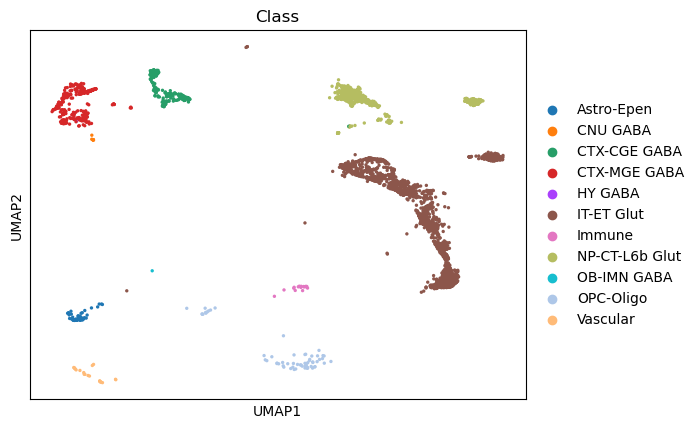

In [53]:
sc.pl.umap(mcg, color=['Class'], ncols=2)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


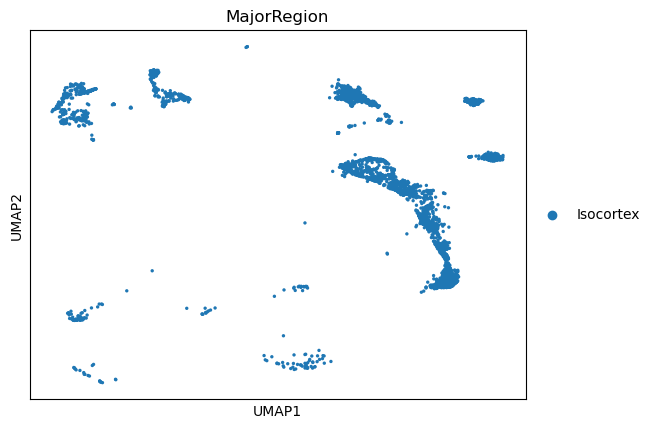

In [54]:
sc.pl.umap(mch, color=['MajorRegion'], ncols=2)

# Prepare the mcds file will 100k bin 

In [55]:
var_dim = 'chrom100k'
mcds_bin = MCDS.open('/data2st1/junyi/methlyatlas/mCseq/data.nemoarchive.org/biccn/grant/u19_cemba/ecker/epigenome/cellgroup/mCseq3/mouse/processed/counts/CEMBA.snmC.mcds',
                   obs_dim='cell',var_dim=var_dim,use_obs=selected_df_meta.cell)

total_feature = mcds_bin.get_index(var_dim).size
mcds_bin


<xarray.MCDS>
Dimensions:             (cell: 5111, chrom100k: 27269, count_type: 2, mc_type: 2)
Coordinates:
  * cell                (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * chrom100k           (chrom100k) <U10 'chr1_0' 'chr1_1' ... 'chrY_917'
    chrom100k_chrom     (chrom100k) <U5 'chr1' 'chr1' 'chr1' ... 'chrY' 'chrY'
    chrom100k_cov_mean  (chrom100k) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    chrom100k_end       (chrom100k) int64 100000 200000 ... 91700000 91744698
    chrom100k_start     (chrom100k) int64 0 100000 200000 ... 91600000 91700000
  * count_type          (count_type) <U3 'mc' 'cov'
  * mc_type             (mc_type) <U3 'CHN' 'CGN'
Data variables:
    chrom100k_da        (cell, chrom100k, mc_type, count_type) uint16 dask.array<chunksize=(1000, 27269, 1, 1), meta=np.ndarray>
    chrom100k_da_frac   (cell, chrom100k, mc_type) float16 dask.array<chunksize=(1000, 27269, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  chrom100k

In [56]:
selected_df_meta.set_index('cell',inplace=True)

In [57]:
mcds_bin.add_cell_metadata(selected_df_meta)


Using existing chrom100k_cov_mean in MCDS.coords, if this is not desired, delete the existing results by `del mcds.coords["chrom100k_cov_mean"]` and recalculate.


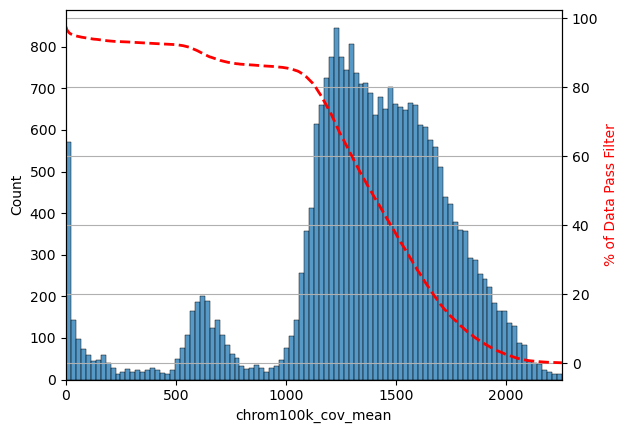

In [58]:
mcds_bin.add_feature_cov_mean(var_dim=var_dim)


In [59]:

# feature cov cutoffs
min_cov = 500
max_cov = 3000
black_list_fraction = 0.2
black_list_path = mm10.ENCODE_BLACKLIST_PATH
exclude_chromosome = ['chrM']
# HVF
mch_pattern = 'CHN'
mcg_pattern = 'CGN'
n_top_feature = 20000

# PC cutoff
pc_cutoff = 0.1

# KNN
knn = -1  # -1 means auto determine

# Leiden
resolution = 1


# filter by coverage - based on the distribution above
mcds_bin = mcds_bin.filter_feature_by_cov_mean(
    min_cov=min_cov,  # minimum coverage
    max_cov=max_cov  # maximum coverage
)

# remove blacklist regions
mcds_bin = mcds_bin.remove_black_list_region(
    black_list_path=black_list_path,
    f=black_list_fraction  # Features having overlap > f with any black list region will be removed.
)

# remove chromosomes
mcds_bin = mcds_bin.remove_chromosome(exclude_chromosome)

Before cov mean filter: 27269 chrom100k
 After cov mean filter: 25187 chrom100k 92.4%
1166 chrom100k features removed due to overlapping (bedtools intersect -f 0.2) with black list regions.
1 chrom100k features in ['chrM'] removed.


In [60]:
mcds_bin

<xarray.MCDS>
Dimensions:                 (cell: 5111, chrom100k: 24032, count_type: 2,
                             mc_type: 2)
Coordinates: (12/37)
  * cell                    (cell) object '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * chrom100k               (chrom100k) <U10 'chr1_30' 'chr1_31' ... 'chrY_99'
    chrom100k_chrom         (chrom100k) <U5 'chr1' 'chr1' ... 'chrY' 'chrY'
    chrom100k_cov_mean      (chrom100k) float64 1.237e+03 1.223e+03 ... 530.9
    chrom100k_end           (chrom100k) int64 3100000 3200000 ... 10000000
    chrom100k_start         (chrom100k) int64 3000000 3100000 ... 9900000
    ...                      ...
    cell_mc_all_umap_0      (cell) float64 17.19 17.2 17.17 ... 1.918 1.866
    cell_mc_all_umap_1      (cell) float64 0.998 0.5132 2.324 ... -9.401 -9.493
    cell_mr_tsne_0          (cell) float64 -7.342 -3.027 -33.84 ... 69.85 70.81
    cell_mr_tsne_1          (cell) float64 -12.4 -11.31 -18.18 ... -46.22 -46.69
    cell_mr_tsne_0.1        (cell) float64 -7.342 -3.027 -33.84 ... 69.85 70.81
    cell_mr_tsne_1.1        (cell) float64 -12.4 -11.31 -18.18 ... -46.22 -46.69
Data variables:
    chrom100k_da            (cell, chrom100k, mc_type, count_type) uint16 dask.array<chunksize=(1000, 24032, 1, 1), meta=np.ndarray>
    chrom100k_da_frac       (cell, chrom100k, mc_type) float16 dask.array<chunksize=(1000, 24032, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  chrom100k

In [61]:
load = True
mcds_bin.add_mc_frac(
normalize_per_cell=True,  # after calculating mC frac, per cell normalize the matrix
    clip_norm_value=10  # clip outlier values above 10 to 10
)
obs_dim = 'cell'

# load only the mC fraction matrix into memory so following steps is faster
# Only load into memory when your memory size is enough to handle your dataset
if load and (mcds_bin.get_index(obs_dim).size < 20000):
    mcds_bin[f'{var_dim}_da_frac'].load()


In [62]:
mch_bin_hvf = mcds_bin.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mcg_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)

Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24032
Highly Variable Feature:  20000 (83.2%)


In [63]:
mcg_bin_adata = mcds_bin.get_adata(mc_type=mcg_pattern,
                           var_dim=var_dim,
                           select_hvf=True)
mcg_bin_adata


AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select'

In [64]:
mcg_bin_adata.obs.head()

,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,Sample,...,Class,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1
cell,,,,,,,,,,,,,,,,,,,,,
3A_M_2344,0.00563,0.78408,0.02258,849066.0,PFC-2,CEMBA180130_3A_3,15,7,3,3A_180130,...,IT-ET Glut,Glut,40.653650,-14.413221,17.185316,0.998016,-7.341658,-12.395177,-7.341658,-12.395177
3A_M_2548,0.00552,0.77832,0.02282,1833564.0,PFC-2,CEMBA180130_3A_3,4,12,3,3A_180130,...,IT-ET Glut,Glut,41.081020,-16.281730,17.195732,0.513242,-3.027135,-11.314671,-3.027135,-11.314671
3A_M_344,0.00705,0.78540,0.02722,1488839.0,PFC-2,CEMBA180129_3A_2,15,7,3,3A_180129,...,IT-ET Glut,Glut,47.637700,-14.097347,17.171260,2.323676,-33.838238,-18.175920,-33.838238,-18.175920
2A_M_1788,0.00432,0.76055,0.01828,1465022.0,PFC-1,CEMBA180123_2A_2,17,12,2,2A_180123,...,IT-ET Glut,Glut,30.318504,-23.202215,16.092295,-3.141345,19.269602,-41.778572,19.269602,-41.778572
2A_M_2460,0.00438,0.76798,0.01876,2045399.0,PFC-1,CEMBA180123_2A_3,11,12,2,2A_180123,...,IT-ET Glut,Glut,30.172178,-23.249279,15.990586,-3.235248,23.329296,-46.827106,23.329296,-46.827106


In [65]:
from ALLCools.clustering import tsne, significant_pc_test, log_scale
from ALLCools.plot import *

In [66]:
mcg_bin_adata

AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select'

In [67]:
log_scale(mcg_bin_adata)


StandardScaler(with_mean=False)

24 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (5111, 50) to (5111, 24)
Red axis labels are used PCs


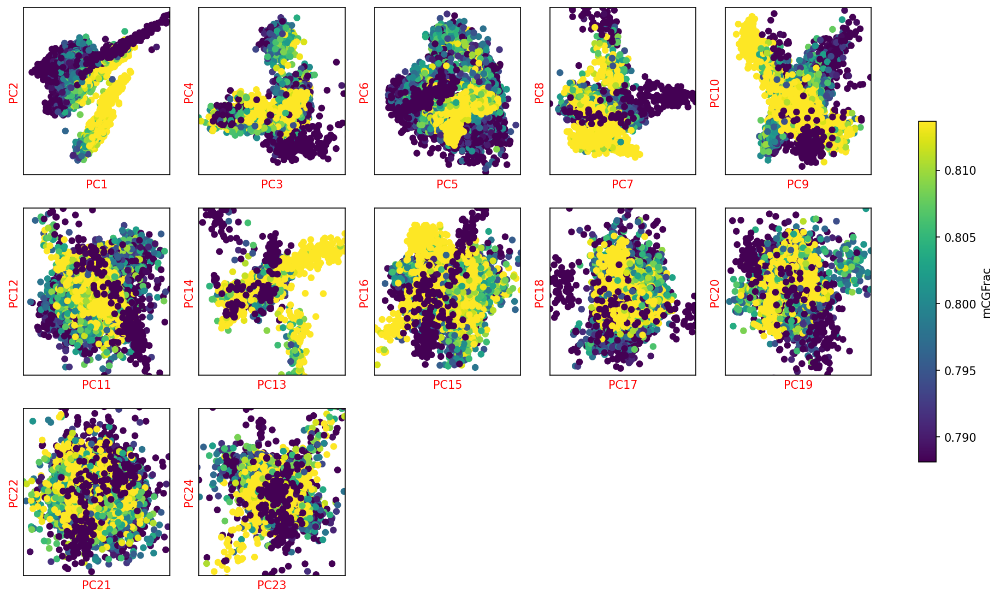

In [68]:
mcg_col_name = 'mCGFrac'  # Name may change

sc.tl.pca(mcg_bin_adata)
cg_n_components = significant_pc_test(mcg_bin_adata)
fig, axes = plot_decomp_scatters(mcg_bin_adata,
                                 n_components=cg_n_components,
                                 hue=mcg_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

In [69]:
mch_hvf = mcds_bin.calculate_hvf_svr(var_dim=var_dim,
                                 mc_type=mch_pattern,
                                 n_top_feature=n_top_feature,
                                 plot=True)


Fitting SVR with gamma 0.0416, predicting feature dispersion using mc_frac_mean and cov_mean.
Total Feature Number:     24032
Highly Variable Feature:  20000 (83.2%)


In [70]:
mch_bin_adata = mcds_bin.get_adata(mc_type=mch_pattern,
                           var_dim=var_dim,
                           select_hvf=True)
mch_bin_adata


AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'

In [71]:
mch_bin_adata

AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'

48 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (5111, 50) to (5111, 48)
Red axis labels are used PCs


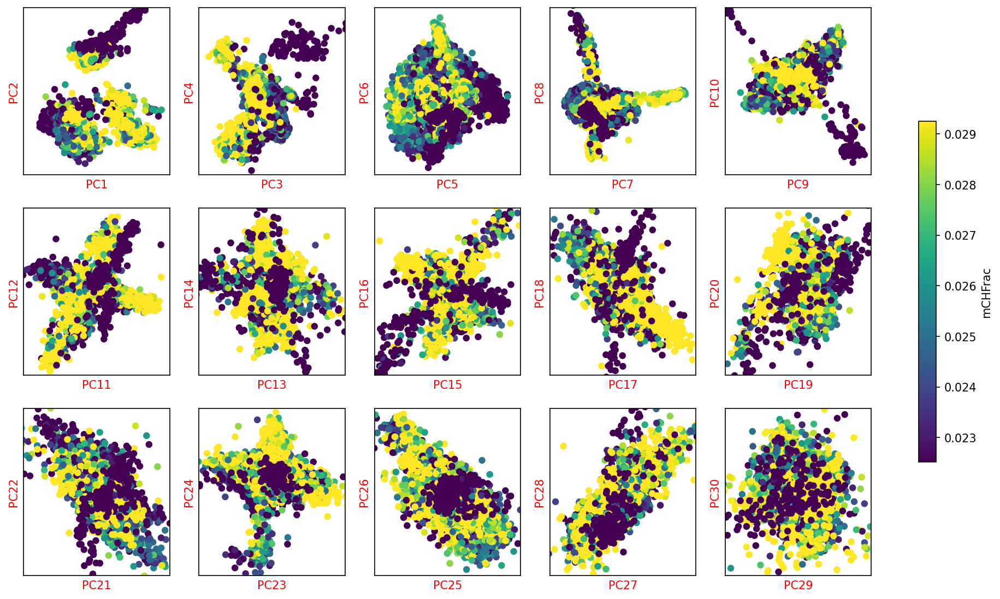

In [72]:
mch_col_name = "mCHFrac"
sc.tl.pca(mch_bin_adata)
ch_n_components = significant_pc_test(mch_bin_adata)
fig, axes = plot_decomp_scatters(mch_bin_adata,
                                 n_components=ch_n_components,
                                 hue=mch_col_name,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=3,
                                 ncols=5)

In [73]:
import numpy as np
ch_pcs = mch_bin_adata.obsm['X_pca'][:, :ch_n_components]
cg_pcs = mcg_bin_adata.obsm['X_pca'][:, :cg_n_components]

cg_pcs = cg_pcs / cg_pcs.std()
ch_pcs = ch_pcs / ch_pcs.std()

# total_pcs
total_pcs = np.hstack([ch_pcs, cg_pcs])

# make a copy of adata, add new pcs
# this is suboptimal, will change this when adata can combine layer and X in the future
adata_merged = mch_bin_adata.copy()
adata_merged.obsm['X_pca'] = total_pcs


In [74]:
adata_merged

AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

In [75]:
if knn == -1:
    knn = max(15, int(np.log2(adata_merged.shape[0])*2))


In [76]:
sc.pp.neighbors(adata_merged, n_neighbors=knn)


In [77]:
sc.tl.leiden(adata_merged, resolution=resolution)


In [78]:
sc.tl.umap(adata_merged)



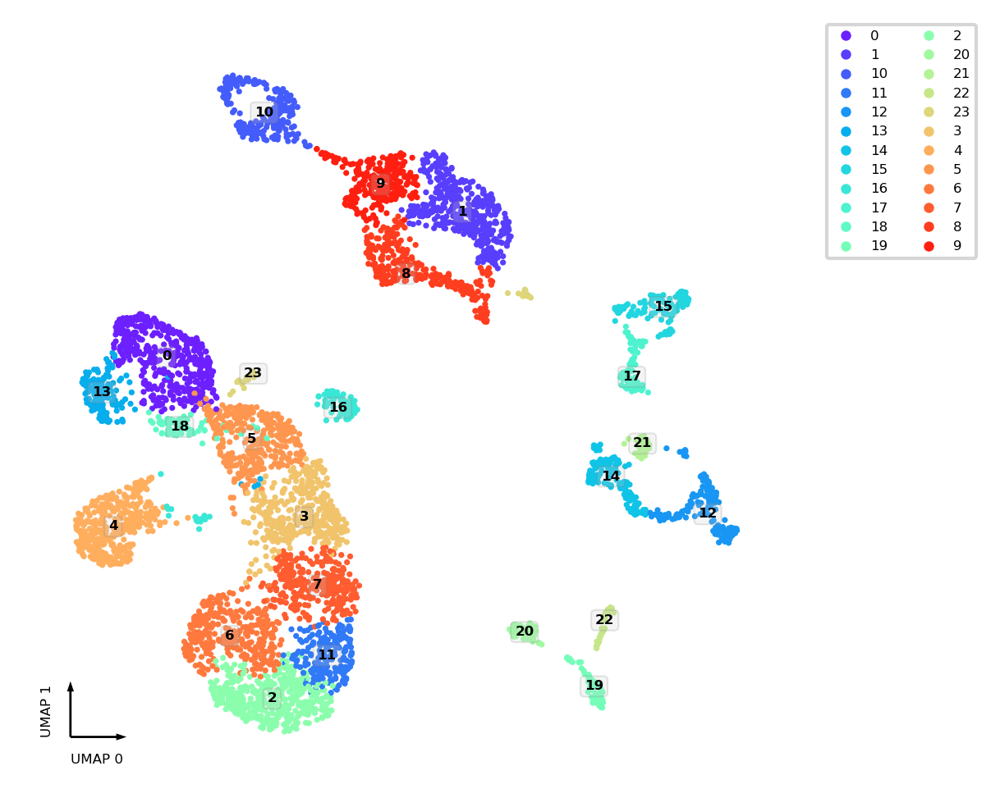

In [79]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)


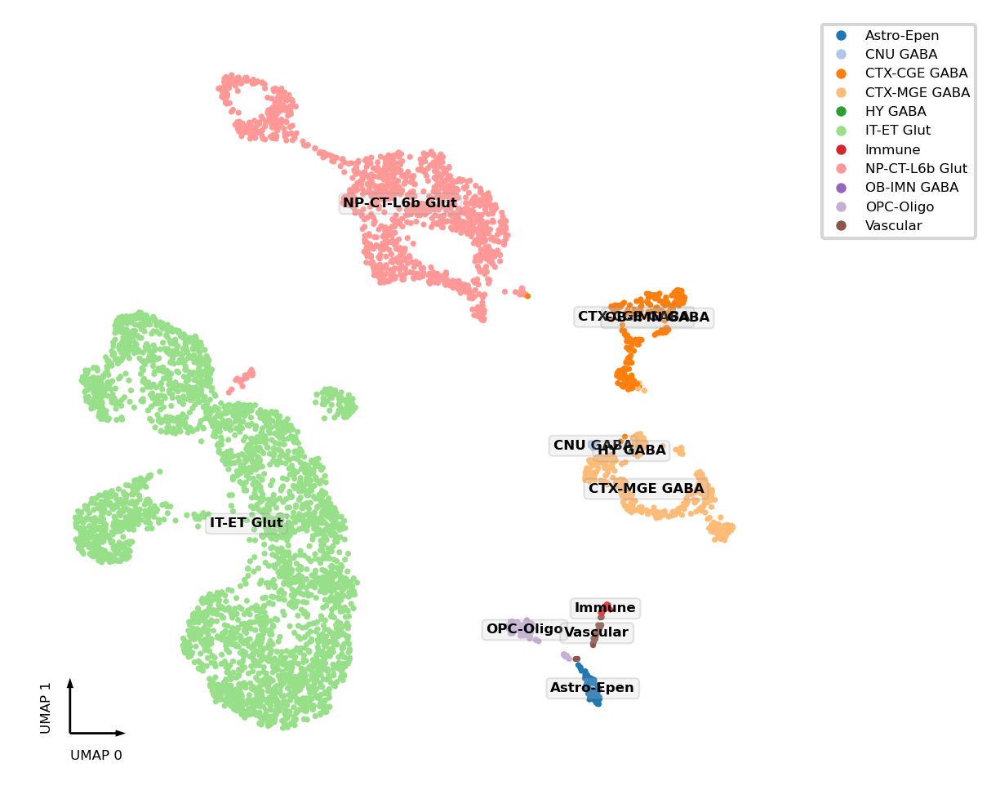

In [80]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='Class',
                        text_anno='Class',
                        show_legend=True)


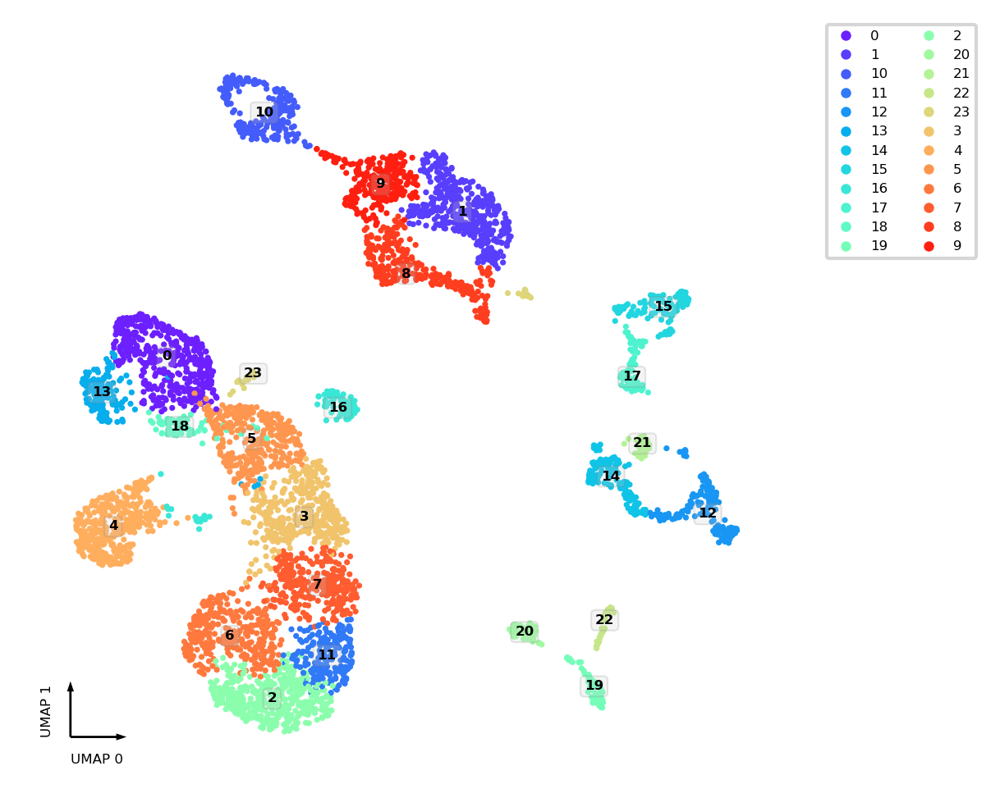

In [81]:
fig, ax = plt.subplots(figsize=(4, 4), dpi=300)
_ = categorical_scatter(data=adata_merged,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        text_anno='leiden',
                        show_legend=True)

In [82]:
pd.DataFrame(set(adata_merged.obs['SubClass'])).to_csv('output/subclass.csv.gz')

In [83]:
interactive_scatter(data=mcg,
                    hue='Class',
                    coord_base='umap',
                    max_points=3000)

In [84]:
interactive_scatter(data=adata_merged,
                    hue='Class',
                    coord_base='umap',
                    max_points=3000)

In [85]:
adata_sc.obs.columns

Index(['sample', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'doublet_score', 'predicted_doublet',
       'batch', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'pred_dmb',
       'pred_mwb', 'pred_mdg', 'pred_mih', 'pred_mpd', 'sampleID', 'tech',
       'louvain'],
      dtype='object')

In [87]:
map_subclass_class = dict(zip(adata_merged.obs['SubClass'], adata_merged.obs['Class']))

In [88]:
cell_class = adata_sc.obs['pred_mwb'].str.replace(r'^\d+\s', '')
convert_class = []
for i in range(0,len(cell_class)):
    cc = cell_class[i] 
    if cc not in map_subclass_class:
        convert_class.append(cc)
    else:
        convert_class.append(map_subclass_class[cc])   


/tmp/ipykernel_1549441/669084307.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



In [89]:
adata_sc.obs['pred_Class'] = convert_class

In [90]:
interactive_scatter(data=adata_sc,
                    hue='pred_mwb',
                    coord_base='umap',
                    max_points=3000)

In [91]:
interactive_scatter(data=adata_sc,
                    hue='pred_Class',
                    coord_base='umap',
                    max_points=3000)

In [92]:
interactive_scatter(data=adata_merged,
                    hue='leiden',
                    coord_base='umap',
                    max_points=5000)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning:

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored



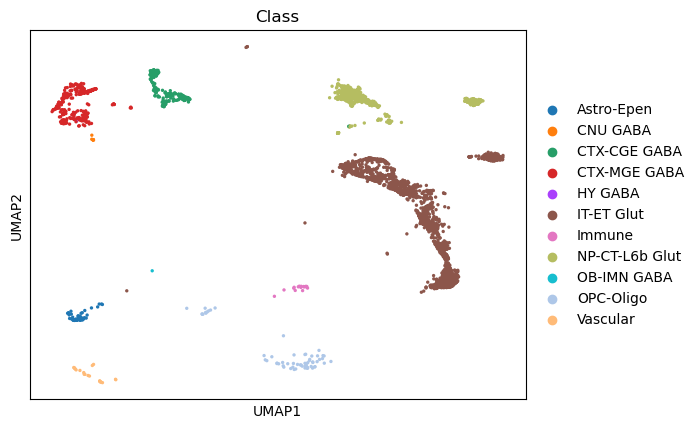

In [93]:
sc.pl.umap(mcg, color=['Class'], ncols=2)

In [94]:
adata_merged.write_h5ad('output/Brain-pfc-chrom100k-clustering.h5ad')
adata_merged


AnnData object with n_obs × n_vars = 5111 × 20000
    obs: 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1', 'leiden'
    var: 'chrom', 'cov_mean', 'end', 'start', 'CGN_mean', 'CGN_dispersion', 'CGN_cov', 'CGN_score', 'CGN_feature_select', 'CHN_mean', 'CHN_dispersion', 'CHN_cov', 'CHN_score', 'CHN_feature_select'
    uns: 'pca', 'neighbors', 'leiden', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [95]:
adata_merged.obs.to_csv('output/Brain-pfc-ClusteringResults.csv.gz')
adata_merged.obs.head()


,mCCCFrac,mCGFrac,mCHFrac,FinalmCReads,DissectionRegion,Plate,Col384,Row384,Slice,Sample,...,NeuroTransmitters,mc_all_tsne_0,mc_all_tsne_1,mc_all_umap_0,mc_all_umap_1,mr_tsne_0,mr_tsne_1,mr_tsne_0.1,mr_tsne_1.1,leiden
cell,,,,,,,,,,,,,,,,,,,,,
3A_M_2344,0.00563,0.78408,0.02258,849066.0,PFC-2,CEMBA180130_3A_3,15,7,3,3A_180130,...,Glut,40.653650,-14.413221,17.185316,0.998016,-7.341658,-12.395177,-7.341658,-12.395177,7
3A_M_2548,0.00552,0.77832,0.02282,1833564.0,PFC-2,CEMBA180130_3A_3,4,12,3,3A_180130,...,Glut,41.081020,-16.281730,17.195732,0.513242,-3.027135,-11.314671,-3.027135,-11.314671,7
3A_M_344,0.00705,0.78540,0.02722,1488839.0,PFC-2,CEMBA180129_3A_2,15,7,3,3A_180129,...,Glut,47.637700,-14.097347,17.171260,2.323676,-33.838238,-18.175920,-33.838238,-18.175920,3
2A_M_1788,0.00432,0.76055,0.01828,1465022.0,PFC-1,CEMBA180123_2A_2,17,12,2,2A_180123,...,Glut,30.318504,-23.202215,16.092295,-3.141345,19.269602,-41.778572,19.269602,-41.778572,2
2A_M_2460,0.00438,0.76798,0.01876,2045399.0,PFC-1,CEMBA180123_2A_3,11,12,2,2A_180123,...,Glut,30.172178,-23.249279,15.990586,-3.235248,23.329296,-46.827106,23.329296,-46.827106,2


In [96]:
mcds

<xarray.MCDS>
Dimensions:                   (cell: 5111, geneslop2k-vm23: 32208, mc_type: 2)
Coordinates:
  * cell                      (cell) <U15 '3A_M_2344' '3A_M_2548' ... '2A_M_949'
  * geneslop2k-vm23           (geneslop2k-vm23) <U18 'ENSMUSG00000051951' ......
    geneslop2k-vm23_chrom     (geneslop2k-vm23) <U5 'chr1' 'chr1' ... 'chrM'
    geneslop2k-vm23_cov_mean  (geneslop2k-vm23) float64 6.313e+03 ... 312.2
    geneslop2k-vm23_end       (geneslop2k-vm23) int64 3673498 3515553 ... 16299
    geneslop2k-vm23_start     (geneslop2k-vm23) int64 3203901 3464587 ... 12145
  * mc_type                   (mc_type) <U3 'CGN' 'CHN'
Data variables:
    geneslop2k-vm23_da_frac   (cell, geneslop2k-vm23, mc_type) float32 dask.array<chunksize=(1000, 32208, 1), meta=np.ndarray>
Attributes:
    obs_dim:  cell
    var_dim:  geneslop2k-vm23

In [97]:
n_genes =10000

In [98]:
sc.pp.highly_variable_genes(mcg, n_top_genes=n_genes, n_bins=20)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:218: RuntimeWarning:

invalid value encountered in log



In [99]:
sc.pp.highly_variable_genes(mch, n_top_genes=n_genes, n_bins=20)

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/scanpy/preprocessing/_highly_variable_genes.py:218: RuntimeWarning:

invalid value encountered in log



In [100]:
adata_raw = sc.read_10x_mtx("/data1st1/seq_from_our_lab/NovaSeq_mmBrain_X101SC24104268-Z01/X101SC24104268-Z01-J001/seeksoul_output/W1/step3/filtered_feature_bc_matrix")

In [101]:
adata_raw.var

,gene_ids,feature_types
Xkr4,ENSMUSG00000051951,Gene Expression
Gm37381,ENSMUSG00000102343,Gene Expression
Rp1,ENSMUSG00000025900,Gene Expression
Sox17,ENSMUSG00000025902,Gene Expression
Gm37323,ENSMUSG00000104328,Gene Expression
...,...,...
AC168977.1,ENSMUSG00000079808,Gene Expression
AC149090.1,ENSMUSG00000095041,Gene Expression
CAAA01118383.1,ENSMUSG00000063897,Gene Expression
Vmn2r122,ENSMUSG00000096730,Gene Expression


In [102]:
adata_sc.var['gane_name'] = adata_sc.var.index

In [103]:
adata_sc.var

,mt,n_cells_by_counts-0,mean_counts-0,log1p_mean_counts-0,pct_dropout_by_counts-0,total_counts-0,log1p_total_counts-0,highly_variable-0,means-0,dispersions-0,...,variances-1,variances_norm-1,highly_variable_nbatches-1,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,gane_name
Xkr4,False,40547,15.705115,2.815715,13.004205,731984.0,13.503515,False,15.705115,1.828880,...,24.259528,1.052374,0,False,NaN,11.067082,246.025292,1.100350,0,Xkr4
Gm37381,False,99,0.002188,0.002186,99.787590,102.0,4.634729,False,0.002188,0.885140,...,0.000092,0.995483,0,False,NaN,0.001325,0.001399,0.963477,0,Gm37381
Rp1,False,1384,0.031754,0.031260,97.030553,1480.0,7.300473,False,0.031754,0.584985,...,0.002478,0.992670,0,False,NaN,0.019655,0.022097,0.918056,0,Rp1
Sox17,False,98,0.003733,0.003726,99.789736,174.0,5.164786,True,0.003733,2.791106,...,0.000613,1.133911,1,True,861.0,0.002398,0.007038,1.847386,5,Sox17
Gm37323,False,13,0.000279,0.000279,99.972108,13.0,2.639057,False,0.000279,-0.820078,...,0.000031,0.500068,0,False,NaN,0.000177,0.000177,0.651889,0,Gm37323
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,False,36,0.000772,0.000772,99.922760,36.0,3.610918,False,0.000772,1.998929,...,0.000031,0.500068,0,False,NaN,0.000467,0.000467,0.790622,0,AC168977.1
AC149090.1,False,33180,4.590049,1.720988,28.810505,213933.0,12.273423,False,4.590049,1.670890,...,1.900554,1.052991,0,False,1812.0,3.094765,26.906226,1.122198,2,AC149090.1
CAAA01118383.1,False,3490,0.083248,0.079963,92.512015,3880.0,8.263848,False,0.083248,1.323510,...,0.016454,0.953380,0,False,NaN,0.055607,0.064281,0.895764,0,CAAA01118383.1
Vmn2r122,False,0,0.000000,0.000000,100.000000,0.0,0.000000,False,0.000000,NaN,...,0.000000,0.000000,0,False,NaN,0.000000,0.000000,0.000000,0,Vmn2r122


In [104]:
var_merged = adata_raw.var.merge(adata_sc.var,how='outer',left_index=True,right_index=True,indicator=True)
var_merged

,gene_ids,feature_types,mt,n_cells_by_counts-0,mean_counts-0,log1p_mean_counts-0,pct_dropout_by_counts-0,total_counts-0,log1p_total_counts-0,highly_variable-0,...,variances_norm-1,highly_variable_nbatches-1,highly_variable,highly_variable_rank,means,variances,variances_norm,highly_variable_nbatches,gane_name,_merge
0610006L08Rik,ENSMUSG00000108652,Gene Expression,False,488.0,0.010771,0.010713,98.952969,502.0,6.220590,False,...,1.199852,2.0,False,1289.5,0.006552,0.006938,0.981850,2.0,0610006L08Rik,both
0610009B22Rik,ENSMUSG00000007777,Gene Expression,False,3681.0,0.086165,0.082654,92.102214,4016.0,8.298290,False,...,0.951403,0.0,False,NaN,0.055316,0.061725,0.870921,0.0,0610009B22Rik,both
0610010F05Rik,ENSMUSG00000042208,Gene Expression,False,29100.0,1.691684,0.990167,37.564367,78846.0,11.275265,False,...,0.936489,0.0,False,NaN,1.169863,3.464708,0.941099,0.0,0610010F05Rik,both
0610010K14Rik,ENSMUSG00000020831,Gene Expression,False,2797.0,0.065182,0.063146,93.998884,3038.0,8.019284,False,...,0.963431,0.0,False,NaN,0.041632,0.046843,0.880443,0.0,0610010K14Rik,both
0610012G03Rik,ENSMUSG00000107002,Gene Expression,False,9999.0,0.278944,0.246034,78.546601,13001.0,9.472858,False,...,0.993750,0.0,False,NaN,0.188735,0.264457,0.948035,0.0,0610012G03Rik,both
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mt-Nd3,ENSMUSG00000064360,Gene Expression,True,1271.0,0.033771,0.033213,97.273000,1574.0,7.362010,True,...,0.999874,0.0,True,1005.0,0.025651,0.045999,1.134224,1.0,mt-Nd3,both
mt-Nd4,ENSMUSG00000064363,Gene Expression,True,8277.0,0.706810,0.534626,82.241246,32943.0,10.402564,True,...,1.138509,1.0,True,62.0,0.468612,40.777472,8.289056,5.0,mt-Nd4,both
mt-Nd4l,ENSMUSG00000065947,Gene Expression,True,1777.0,0.069323,0.067026,96.187350,3231.0,8.080856,True,...,1.030246,0.0,True,897.0,0.043008,0.317972,2.459168,3.0,mt-Nd4l,both
mt-Nd5,ENSMUSG00000064367,Gene Expression,True,3155.0,0.224961,0.202909,93.230776,10485.0,9.257796,True,...,1.045469,0.0,True,314.0,0.143454,5.049482,5.491102,4.0,mt-Nd5,both


In [105]:
adata_sc.var.index

Index(['Xkr4', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15', 'Lypla1',
       'Tcea1', 'Rgs20', 'Atp6v1h',
       ...
       'AC125149.1', 'AC125149.2', 'AC125149.4', 'AC234645.1', 'AC168977.2',
       'AC168977.1', 'AC149090.1', 'CAAA01118383.1', 'Vmn2r122',
       'CAAA01147332.1'],
      dtype='object', length=27734)

In [106]:
adata_sc.var = var_merged.loc[adata_sc.var.index]

In [107]:
adata_sc.var.set_index('gene_ids',inplace=True)

In [108]:
adata_atac_gene = adata.read_h5ad('/data2st1/junyi/snATAC_02_matrix/WT_PFC_W26_geneactivity_n.h5ad')
adata_atac_bin = adata.read_h5ad('/data2st1/junyi/snATAC_02_matrix/WT_PFC_W26_5kb.h5ad')

In [109]:
pcs = pd.read_csv('/data2st1/junyi/snATAC_02_matrix/combined_atac_QC_reduction_pcs.csv',index_col=0)

In [110]:
pcs.index

Index(['CUMS_AAACGAAAGACACGGT-1', 'CUMS_AAACGAAAGAGGTACC-1',
       'CUMS_AAACGAAAGCGTCAAG-1', 'CUMS_AAACGAAAGGCAAGCT-1',
       'CUMS_AAACGAAAGGCTCAGA-1', 'CUMS_AAACGAAAGTAACTCC-1',
       'CUMS_AAACGAAAGTACTCTG-1', 'CUMS_AAACGAAAGTAGACCG-1',
       'CUMS_AAACGAAAGTGAGTTA-1', 'CUMS_AAACGAAAGTGTCACT-1',
       ...
       'WT_TTTGTGTGTGTTTCTT-1', 'WT_TTTGTGTGTTAGCTCA-1',
       'WT_TTTGTGTGTTGCAGCC-1', 'WT_TTTGTGTGTTTCGATG-1',
       'WT_TTTGTGTGTTTGATCG-1', 'WT_TTTGTGTTCACGTCAA-1',
       'WT_TTTGTGTTCCAACAAC-1', 'WT_TTTGTGTTCCGTACGG-1',
       'WT_TTTGTGTTCCTGACCT-1', 'WT_TTTGTGTTCTGACTTT-1'],
      dtype='object', length=31817)

In [111]:
len(set("WT_"+adata_atac_bin.obs.index).intersection(set(pcs.index)))

12971

In [112]:
adata_atac_bin.obs.index = "WT_"+adata_atac_bin.obs.index

In [113]:
adata_atac_gene.obs.index = "WT_"+adata_atac_gene.obs.index

In [114]:
adata_atac_gene

AnnData object with n_obs × n_vars = 13000 × 21439
    obs: 'orig.ident', 'nCount_peaks', 'nFeature_peaks', 'total', 'duplicate', 'chimeric', 'unmapped', 'lowmapq', 'mitochondrial', 'nonprimary', 'passed_filters', 'is__cell_barcode', 'excluded_reason', 'TSS_fragments', 'DNase_sensitive_region_fragments', 'enhancer_region_fragments', 'promoter_region_fragments', 'on_target_fragments', 'blacklist_region_fragments', 'peak_region_fragments', 'peak_region_cutsites', 'nCount_ACTIVITY', 'nFeature_ACTIVITY'

In [115]:
merge_barcode = adata_atac_gene.obs.merge(pcs,left_index=True,right_index=True,how='inner')

In [116]:
adata_atac_selected = adata_atac_gene[merge_barcode.index]

In [117]:
adata_atac_selected.obsm['X_pca'] = pcs.loc[merge_barcode.index].iloc[:,1:].values
# Ignore the first pc 

In [118]:
adata_atac_selected.obsm['X_pca'].shape

(12971, 49)

In [119]:
adata_atac_selected

AnnData object with n_obs × n_vars = 12971 × 21439
    obs: 'orig.ident', 'nCount_peaks', 'nFeature_peaks', 'total', 'duplicate', 'chimeric', 'unmapped', 'lowmapq', 'mitochondrial', 'nonprimary', 'passed_filters', 'is__cell_barcode', 'excluded_reason', 'TSS_fragments', 'DNase_sensitive_region_fragments', 'enhancer_region_fragments', 'promoter_region_fragments', 'on_target_fragments', 'blacklist_region_fragments', 'peak_region_fragments', 'peak_region_cutsites', 'nCount_ACTIVITY', 'nFeature_ACTIVITY'
    obsm: 'X_pca'

In [120]:
adata_atac_selected.obs.head()

,orig.ident,nCount_peaks,nFeature_peaks,total,duplicate,chimeric,unmapped,lowmapq,mitochondrial,nonprimary,...,TSS_fragments,DNase_sensitive_region_fragments,enhancer_region_fragments,promoter_region_fragments,on_target_fragments,blacklist_region_fragments,peak_region_fragments,peak_region_cutsites,nCount_ACTIVITY,nFeature_ACTIVITY
WT_AAACGAAAGACACGGT-1,SeuratProject,14480.0,6996,38701,6793,6,86,2071,60,16,...,5578,0,0,0,5578,0,7712,14480,17721.0,7257
WT_AAACGAAAGAGGTACC-1,SeuratProject,16886.0,7551,23069,7779,9,46,644,0,7,...,4250,0,0,0,4250,0,8722,16886,9815.0,5263
WT_AAACGAAAGCGTCAAG-1,SeuratProject,24249.0,11145,44104,7599,22,105,2102,31,31,...,8187,0,0,0,8187,0,12735,24249,20537.0,8334
WT_AAACGAAAGGCAAGCT-1,SeuratProject,22916.0,10513,42602,6830,13,104,2052,24,23,...,7960,0,0,0,7960,0,11994,22916,20641.0,9027
WT_AAACGAAAGTAACTCC-1,SeuratProject,19048.0,8490,25154,7035,9,74,857,19,32,...,4831,0,0,0,4831,0,9842,19048,11462.0,5752


In [121]:
df_atac_umapdf_atac_umap = pd.read_csv('/data2st1/junyi/snATAC_02_matrix/combined_atac_QC_reduction_umap.csv',index_col=0)
adata_atac_selected.obsm['X_umap_seurat'] = df_atac_umapdf_atac_umap.loc[merge_barcode.index].values

In [122]:
def dump_embedding(adata, name, n_dim=2):
    # put manifold coordinates into adata.obs
    for i in range(n_dim):
        adata.obs[f'{name}_{i}'] = adata.obsm[f'X_{name}'][:, i]
    return


In [123]:
sc.pp.neighbors(adata_atac_selected)
sc.tl.leiden(adata_atac_selected, resolution=1)
sc.tl.umap(adata_atac_selected)
dump_embedding(adata_atac_selected, 'umap')


In [124]:
dump_embedding(adata_atac_selected, 'umap')
dump_embedding(adata_atac_selected, 'umap_seurat')


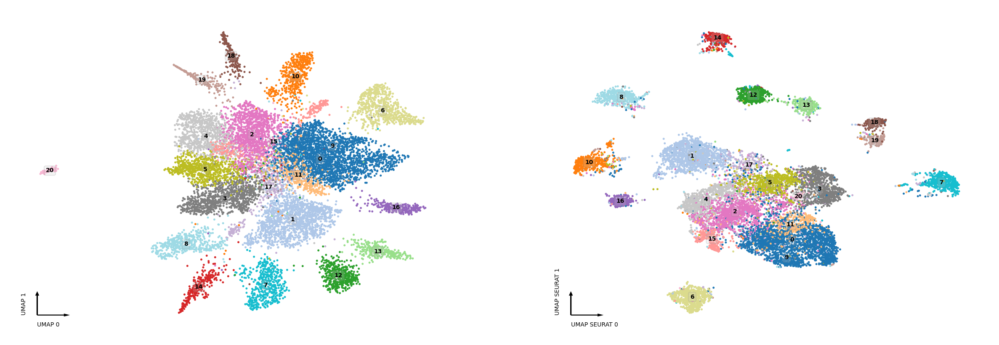

In [125]:
fig, axes = plt.subplots(figsize=(12, 4), dpi=250, ncols=2)

ax = axes[0]
_ = categorical_scatter(data=adata_atac_selected.obs,
                        ax=ax,
                        coord_base='umap',
                        hue='leiden',
                        palette='tab20',
                        text_anno='leiden')
ax = axes[1]
_ = categorical_scatter(data=adata_atac_selected.obs,
                        ax=ax,
                        coord_base='umap_seurat',
                        hue='leiden',
                        palette='tab20',
                        text_anno='leiden')



In [126]:
n_components = significant_pc_test(adata_atac_selected)


24 components passed P cutoff of 0.1.
Changing adata.obsm['X_pca'] from shape (12971, 49) to (12971, 24)


/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decomposition.py:46: UserWarning:

Ignoring `palette` because no `hue` variable has been assigned.

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/ALLCools/plot/decompos

Red axis labels are used PCs


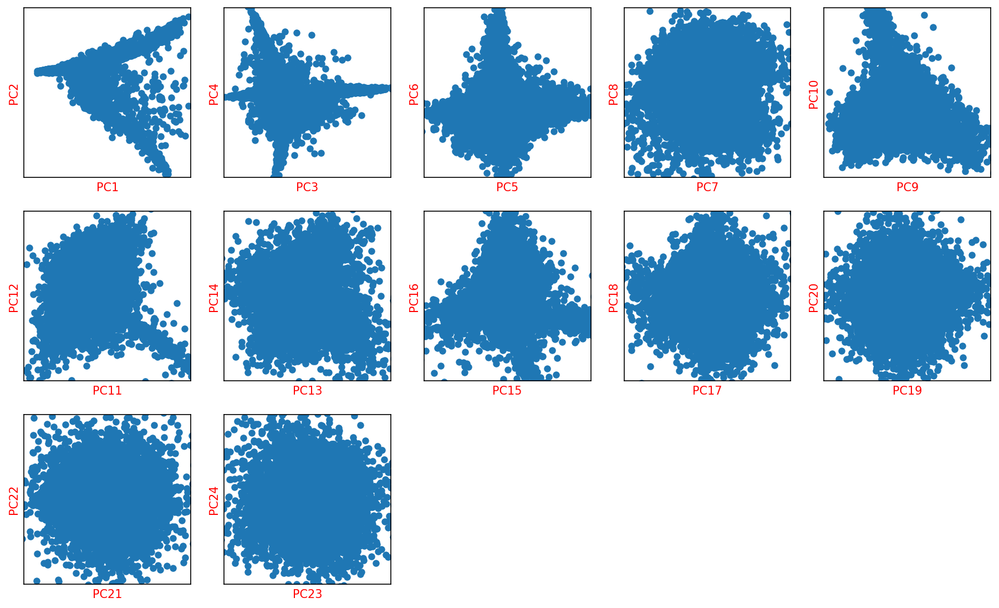

In [127]:
fig, axes = plot_decomp_scatters(adata_atac_selected,
                                 n_components=n_components,
                                 hue=None,
                                 hue_quantile=(0.25, 0.75),
                                 nrows=5,
                                 ncols=5)

In [128]:
# n_genes = 10000
sc.pp.highly_variable_genes(adata_atac_selected, n_top_genes=n_genes, n_bins=20) 

In [129]:
adata_atac_selected.var['gene_id'] = adata_atac_selected.var.index.str.split('.').str[0]

In [130]:
adata_atac_selected.var.set_index('gene_id',inplace=True)

In [131]:
sc_hvf_list = adata_sc.var['variances_norm'].sort_values(ascending=False).dropna()[:n_genes].index


In [132]:
mcg_hvf_list = mcg.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index


In [133]:
mch_hvf_list = mch.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index

In [134]:
atac_hvf_list = adata_atac_selected.var['dispersions_norm'].sort_values(ascending=False).dropna()[:n_genes].index


In [135]:
hvfs = mcg_hvf_list.intersection(sc_hvf_list).intersection(mcg_hvf_list).intersection(atac_hvf_list)

In [136]:
len(hvfs)

1059

In [137]:
adata_sc_selected = adata_sc[(adata_sc.obs.tech == '10x') & (adata_sc.obs.group == 'W')]


In [138]:
adata_sc_selected

View of AnnData object with n_obs × n_vars = 17955 × 27734
    obs: 'sample', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'pred_dmb', 'pred_mwb', 'pred_mdg', 'pred_mih', 'pred_mpd', 'sampleID', 'tech', 'louvain', 'pred_Class'
    var: 'feature_types', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_rank-0', 'variances-0', 'variances_norm-0', 'highly_variable_nbatches-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'highly_variable-1', 'means-1', 'highly_variable_

In [139]:
sc_hvf_adata = adata_sc_selected[:,hvfs].copy()
sc.pp.scale(sc_hvf_adata)
sc_hvf_adata

AnnData object with n_obs × n_vars = 17955 × 1059
    obs: 'sample', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'pred_dmb', 'pred_mwb', 'pred_mdg', 'pred_mih', 'pred_mpd', 'sampleID', 'tech', 'louvain', 'pred_Class'
    var: 'feature_types', 'mt', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'highly_variable-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'highly_variable_rank-0', 'variances-0', 'variances_norm-0', 'highly_variable_nbatches-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'highly_variable-1', 'means-1', 'highly_variable_rank-1', 

In [140]:
mcg.var.index = mcg.var.index.astype(str)
mcg.obs.index = mcg.obs.index.astype(str)
mch.var.index = mch.var.index.astype(str)
mch.obs.index = mch.obs.index.astype(str)

In [141]:
mcg_hvf_adata = mcg[:,hvfs].copy()
sc.pp.scale(mcg_hvf_adata)
mcg_hvf_adata.X *=-1

In [142]:
mch_hvf_adata = mch[:,hvfs].copy()
sc.pp.scale(mch_hvf_adata)
mch_hvf_adata.X *=-1

In [143]:
atac_hvf_adata = adata_atac_selected[:,hvfs].copy()
sc.pp.scale(atac_hvf_adata)

In [144]:
adata_concat = sc_hvf_adata.concatenate([
    mcg_hvf_adata,
    mch_hvf_adata,
    atac_hvf_adata
    
],
                                index_unique='-')
adata_concat.obs['batch'] = adata_concat.obs['batch'].map({
    '0': 'sc',
    '1': 'mcg',
    '2': 'mch',
    '3': 'atac'
    })
adata_concat

/home/junyichen/anaconda3/envs/allcools/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning:

The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html



AnnData object with n_obs × n_vars = 41148 × 1059
    obs: 'sample', 'group', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'doublet_score', 'predicted_doublet', 'batch', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'pred_dmb', 'pred_mwb', 'pred_mdg', 'pred_mih', 'pred_mpd', 'sampleID', 'tech', 'louvain', 'pred_Class', 'cell', 'mCCCFrac', 'mCGFrac', 'mCHFrac', 'FinalmCReads', 'DissectionRegion', 'Plate', 'Col384', 'Row384', 'Slice', 'Sample', 'Technology', 'InputReads', 'PassBasicQC', 'PlateNormCov', 'CEMBARegion', 'MajorRegion', 'SubRegion', 'CellGroup', 'SubClass', 'Class', 'NeuroTransmitters', 'mc_all_tsne_0', 'mc_all_tsne_1', 'mc_all_umap_0', 'mc_all_umap_1', 'mr_tsne_0', 'mr_tsne_1', 'mr_tsne_0.1', 'mr_tsne_1.1', 'orig.ident', 'nCount_peaks', 'nFeature_peaks', 'total', 'duplicate', 'chimeric', 'unmapped', 'lowmapq', 'mi

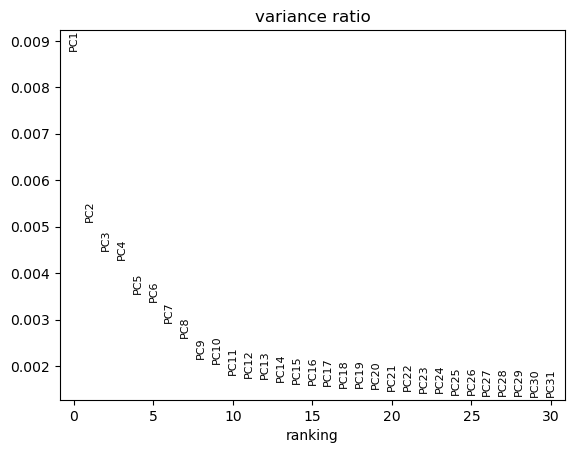

29 components passed P cutoff of 0.2.
Changing adata.obsm['X_pca'] from shape (41148, 50) to (41148, 29)


In [145]:
sc.pp.pca(adata_concat, n_comps=50)
sc.pl.pca_variance_ratio(adata_concat)
n_components = significant_pc_test(adata_concat, p_cutoff=0.2)


In [149]:
adata_concat.obs['predicted_doublet'].fillna('False',inplace=True)
adata_concat.obs["predicted_doublet"] = adata_concat.obs["predicted_doublet"].astype(bool)

adata_concat.var['mt-0'] = adata_concat.var["mt-0"].astype(bool)
adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)

adata_concat.obs['PassBasicQC'] = adata_concat.obs["PassBasicQC"].astype(bool)


In [150]:
adata_concat.write_h5ad('output/merged-PFC-concat-clustering.h5ad')

In [151]:
ho = run_harmony(adata_concat.obsm['X_pca'],
                 meta_data=pd.DataFrame(adata_concat.obs['batch']),
                 vars_use='batch',
                 random_state=0,
                 nclust=100,
                 max_iter_harmony=20)
#adata_concat.obsm['X_pca'] = ho.Z_corr.T


2025-01-20 16:23:52,395 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


: 

In [143]:
adata_concat.write_h5ad('output/merged-harmony-clustering.h5ad')

In [144]:
adata_concat.obsm['X_pca'] = ho.Z_corr.T


In [149]:
sc.pp.neighbors(adata_concat, n_neighbors=5)
sc.tl.leiden(adata_concat, resolution=1.5)
sc.tl.umap(adata_concat)


In [ ]:
_ = plot_decomp_scatters(adata_concat,
                         n_components=n_components,
                         hue='batch',
                         palette='tab10')

In [151]:
adata_concat.obs['umap_0'] = adata_concat.obsm['X_umap'][:, 0]
adata_concat.obs['umap_1'] = adata_concat.obsm['X_umap'][:, 1]


In [ ]:
fig, axes = plt.subplots(figsize=(8, 3), dpi=250, ncols=2)

ax = axes[0]
categorical_scatter(ax=ax,
                    data=adata_concat,
                    hue='batch',
                    show_legend=True,
                    max_points=None,
                    s=1)

ax = axes[1]
categorical_scatter(ax=ax,
                    data=adata_concat,
                    hue='pred_Class',
                    show_legend=True,
                    max_points=None,
                    s=1)

In [ ]:
adata_concat.obs.columns

In [ ]:
adata_concat.obs[adata_concat.obs['batch'] == 'mcg'].copy().columns

In [ ]:
fig, axes = plt.subplots(figsize=(8, 3), dpi=250, ncols=2)

data = adata_concat.obs[adata_concat.obs['batch'] == 'mcg'].copy()
#data['MajorType'] = data['SubType'].str.split('_').str[-1]
data2 = adata_concat.obs[adata_concat.obs['batch'] == 'atac'].copy()


ax = axes[0]
categorical_scatter(ax=ax,
                    data=data,
                    show_legend=False,
                    max_points=None,
                    hue='SubRegion',
                    text_anno='SubRegion',
                    s=1)

ax = axes[1]
categorical_scatter(ax=ax,
                    data=data2,
                    hue='leiden',
                    show_legend=True,
                    text_anno='leiden',

                    max_points=None,
                    s=1)

In [ ]:
adata_sc.obs.columns

In [160]:
df_pred_class=pd.DataFrame(pd.crosstab(adata_concat.obs['pred_Class'], adata_concat.obs['leiden']).idxmax())

In [161]:
df_class=pd.DataFrame(pd.crosstab(adata_concat.obs['Class'], adata_concat.obs['leiden']).idxmax())

In [162]:
df_type_merged = df_pred_class.merge(df_class,how='outer',left_index=True,right_index=True).fillna(method='ffill').fillna(method='bfill')
df_type_merged.columns = ['pred_Class','Class']

In [163]:
lei_map_class = dict(zip(df_type_merged.index,df_type_merged['Class']))
lei_map_pred_class = dict(zip(df_type_merged.index,df_type_merged['pred_Class']))

In [ ]:
adata_concat.obs

In [ ]:
adata_concat.obs

In [165]:
mapped_class = []
mappled_preclass = []
for inde,row in (adata_concat.obs).iterrows():
    if row['leiden'] not in lei_map_class:
        mapped_class.append(row['leiden'])
        mappled_preclass.append(row['leiden'])
    else:
        mapped_class.append(lei_map_class[row['leiden']])
        mappled_preclass.append(lei_map_pred_class[row['leiden']])  


In [166]:
adata_concat.obs['mapped_class'] = mapped_class
adata_concat.obs['mappled_preclass'] = mappled_preclass

In [ ]:
interactive_scatter(data=adata_concat,
                    hue='mappled_preclass',
                    coord_base='umap',
                    max_points=20000)

In [ ]:
interactive_scatter(data=adata_concat,
                    hue='mappled_preclass',
                    coord_base='umap',
                    max_points=10000)

In [ ]:
adata_concat.obs

In [169]:
sc._utils.sanitize_anndata(adata_concat)

In [170]:
adata_concat.obs['predicted_doublet'].fillna('False',inplace=True)
adata_concat.obs["predicted_doublet"] = adata_concat.obs["predicted_doublet"].astype(bool)

adata_concat.var['mt-0'] = adata_concat.var["mt-0"].astype(bool)
adata_concat.var['highly_variable-0-0'] = adata_concat.var["highly_variable-0-0"].astype(bool)
adata_concat.var['highly_variable-1-0'] = adata_concat.var["highly_variable-1-0"].astype(bool)
adata_concat.var['highly_variable-0'] = adata_concat.var["highly_variable-0"].astype(bool)


In [171]:
adata_concat.write_h5ad('output/merged-clustering.h5ad')